# О чем говорят любители рэпа?
# Часть 3: Визуализация данных

In [1]:
import pandas as pd              # Пакет для работы с таблицами
import numpy as np               # Пакет для работы с векторами и матрицами
import matplotlib.pyplot as plt  # Пакет для строительства графиков
import seaborn as sns            # Еще один пакет для графиков
import datetime                  # Пакет для работы с временными форматами
import pickle                    # Пакет для подгрузки данных специфического для питона формата

from dateutil.relativedelta import relativedelta # еще один пакет для работы с временем
from wordcloud import WordCloud  # Пакет для построения облаков слов

plt.style.use('ggplot')          # задаём красивый стиль для графиков matplotlib-а
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore")

# Топики

Визуализируем все 30 топиков, построенных по всему корпусу текста

In [3]:
with open('lda_models/lda_30_topics_bigrams_long_comments', 'rb') as f:
    lda_30_topics = pickle.load(f)

In [4]:
def plotWordCloud(topic_number):
    """
        Строит визуализацию слов на основе текстов топиков
    """
    # получаем частоты и слова топика
    
    text = dict(lda_30_topics[topic_number][1])
    
    # строим облако слов
    wordcloud = WordCloud(background_color="white", max_words=100, width=900, height=900, collocations=False)
    wordcloud = wordcloud.generate_from_frequencies(text)
    plt.figure(figsize=(15, 10))
    plt.title("Топик номер {}".format(topic_number))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off");

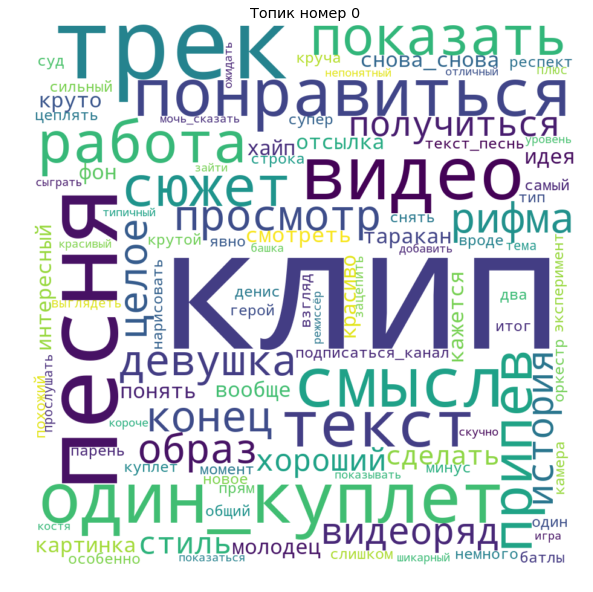

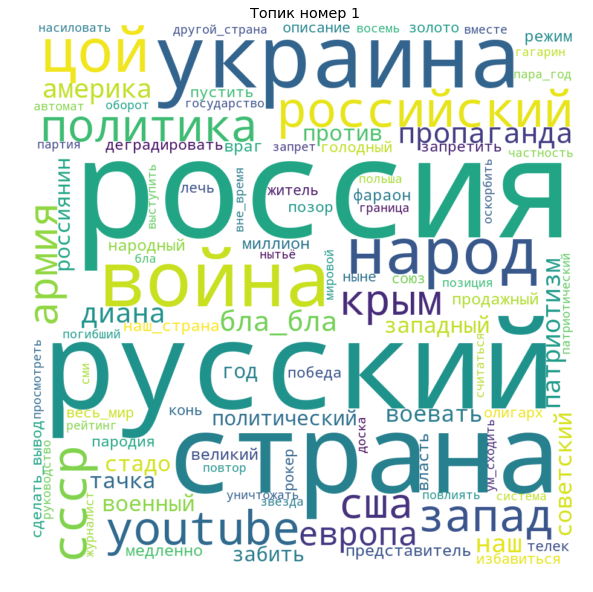

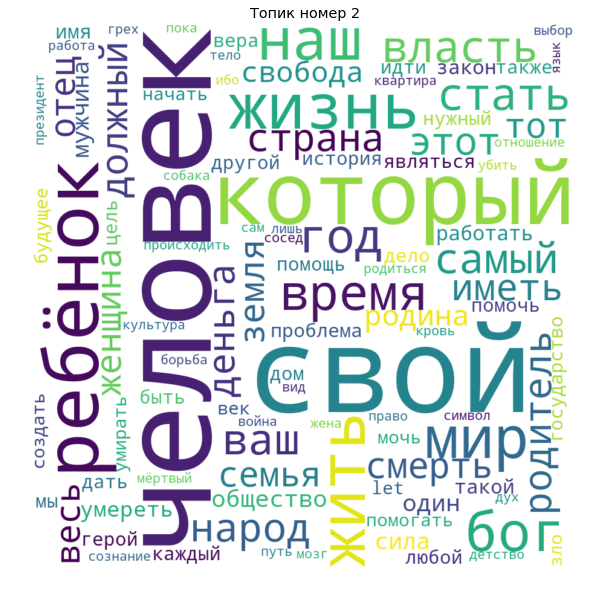

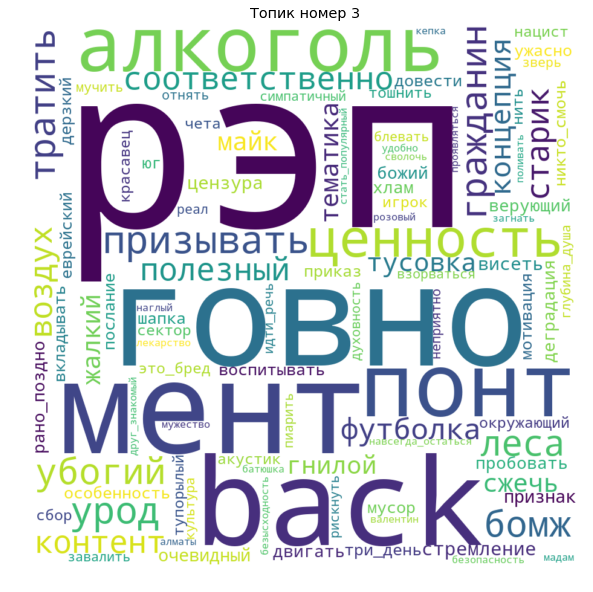

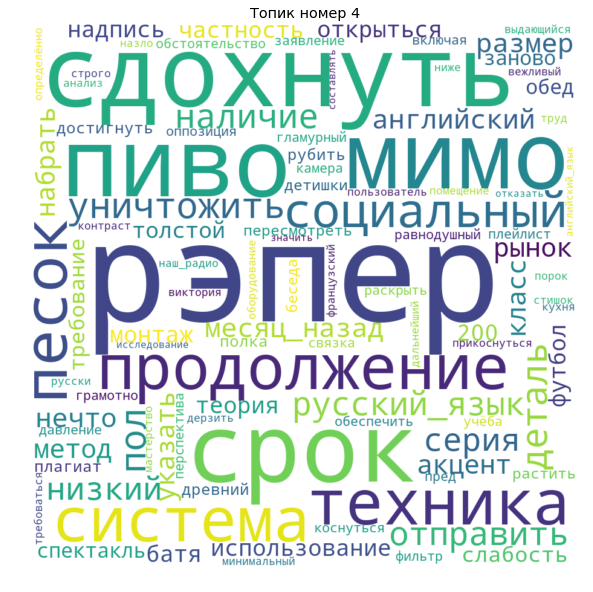

In [163]:
for i in range(5):
    plotWordCloud(topic_number=i)

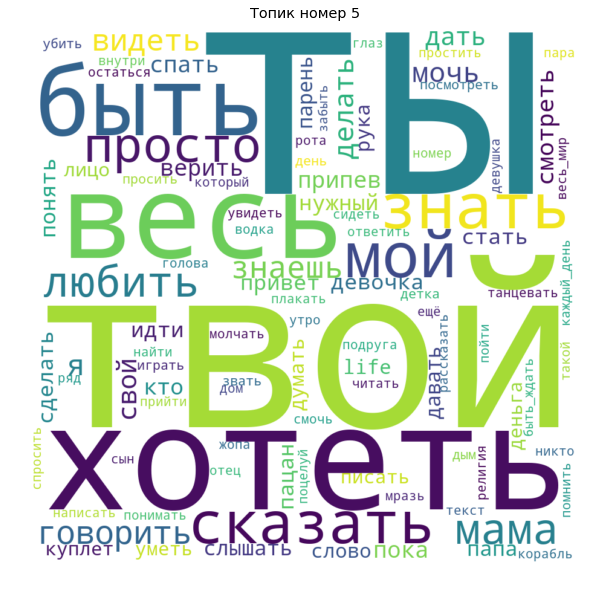

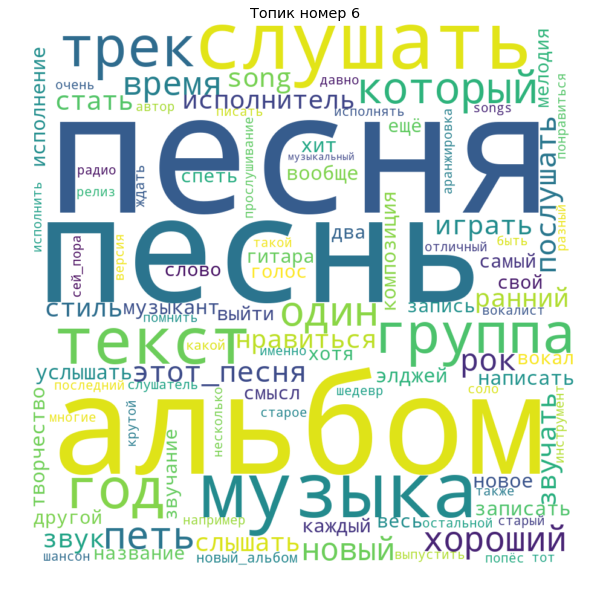

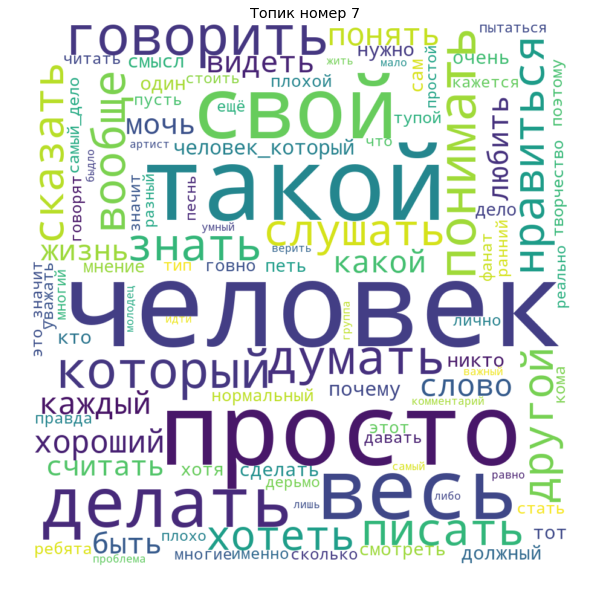

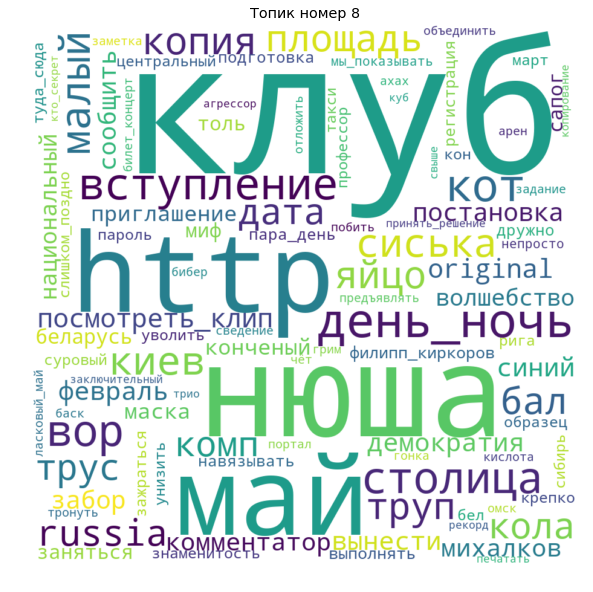

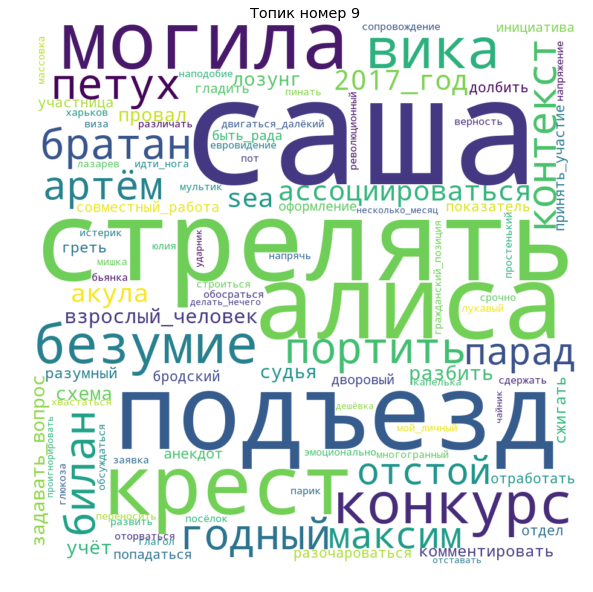

In [164]:
for i in range(5, 10):
    plotWordCloud(topic_number=i)

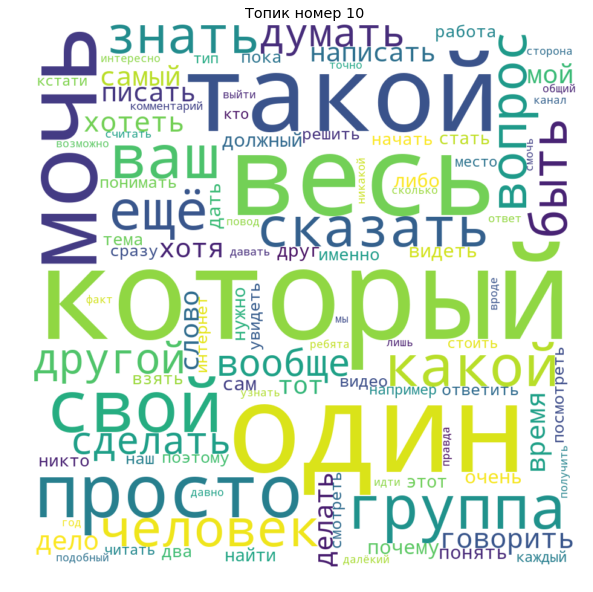

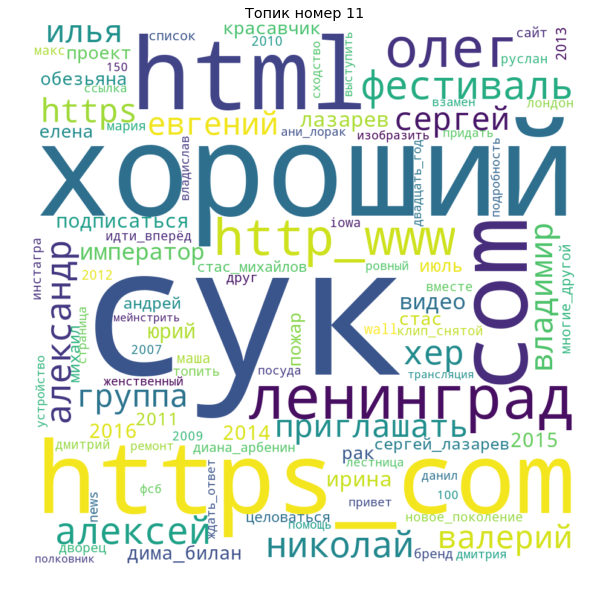

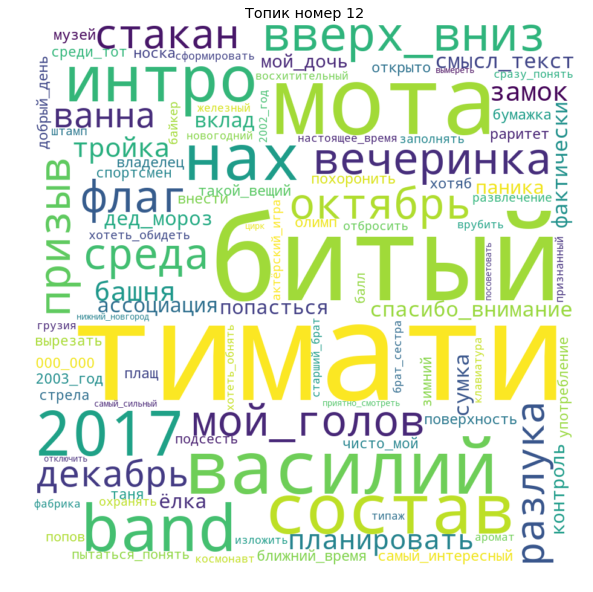

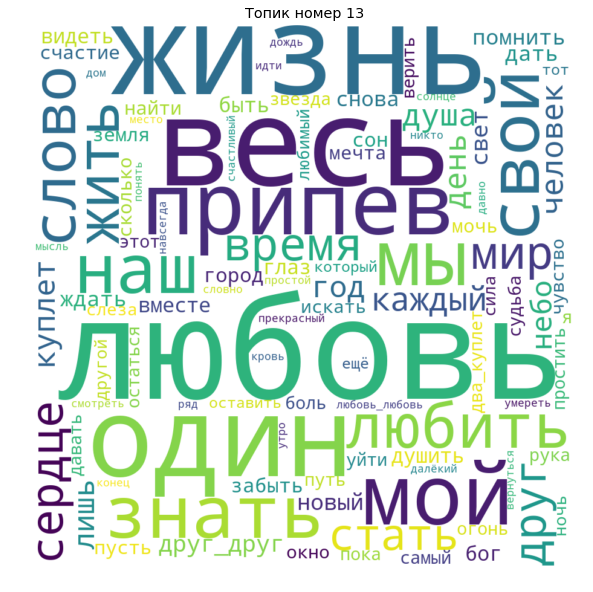

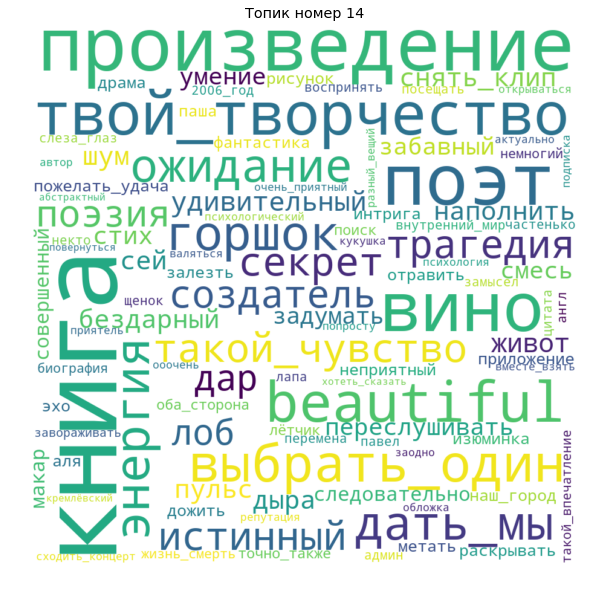

In [165]:
for i in range(10, 15):
    plotWordCloud(topic_number=i)

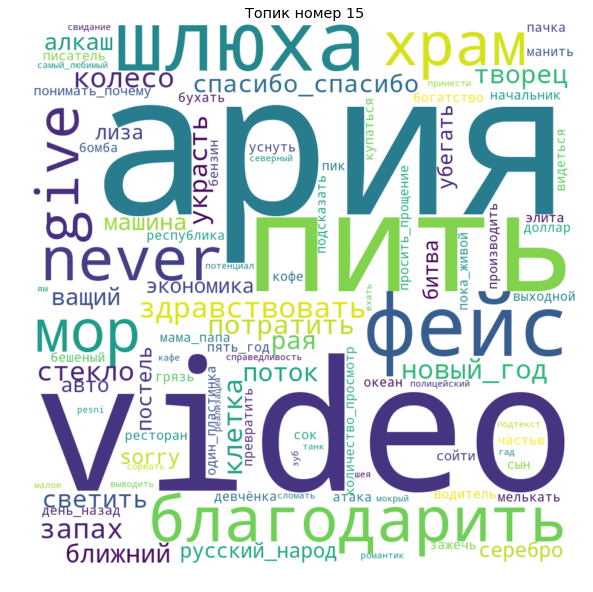

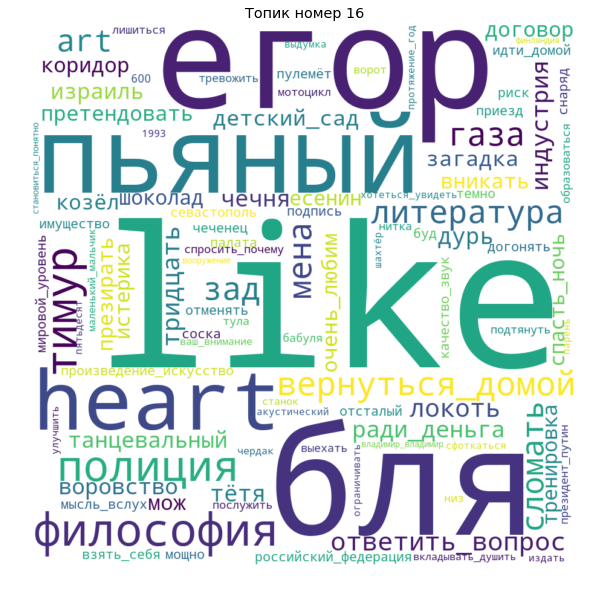

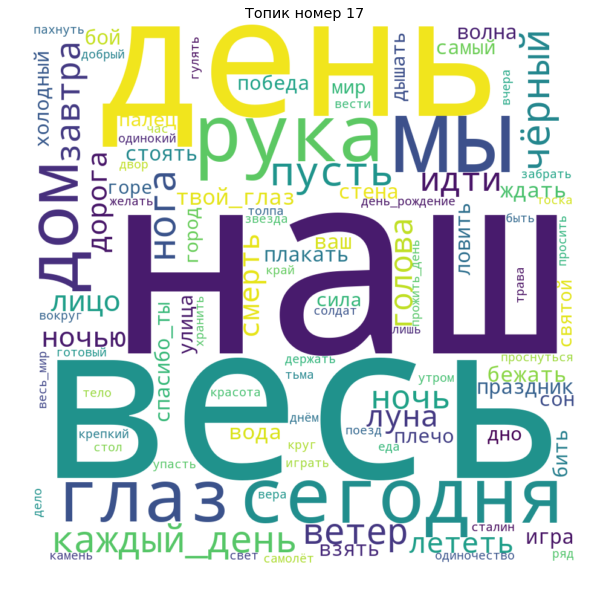

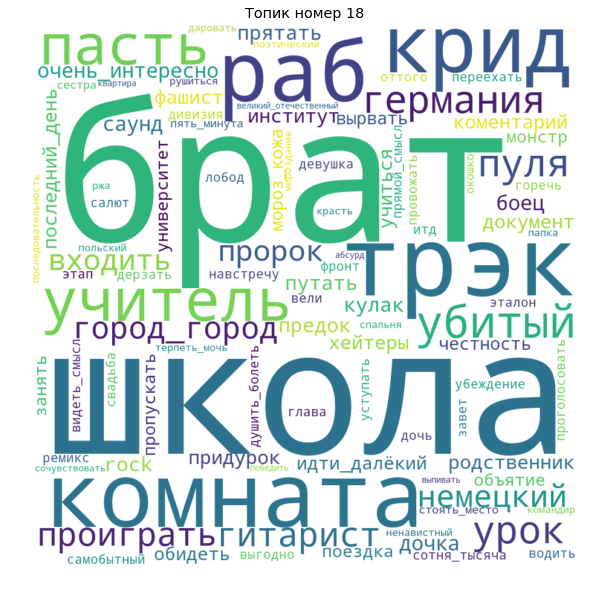

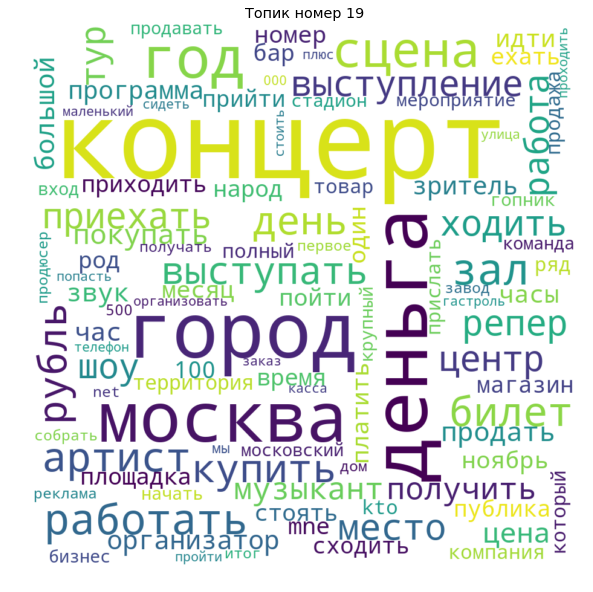

In [166]:
for i in range(15, 20):
    plotWordCloud(topic_number=i)

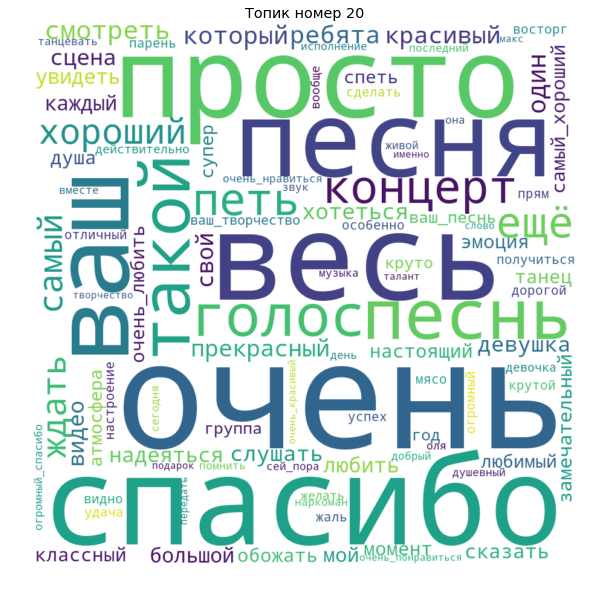

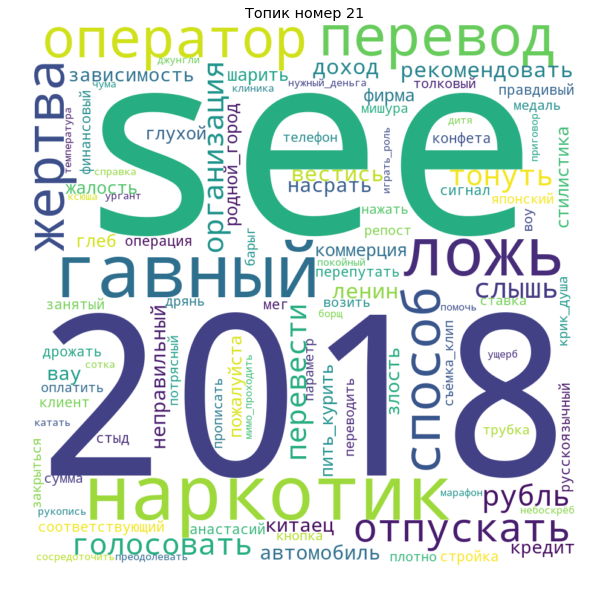

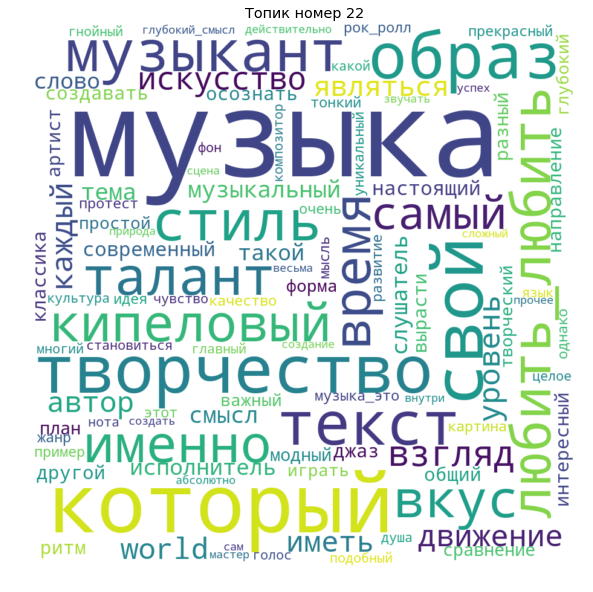

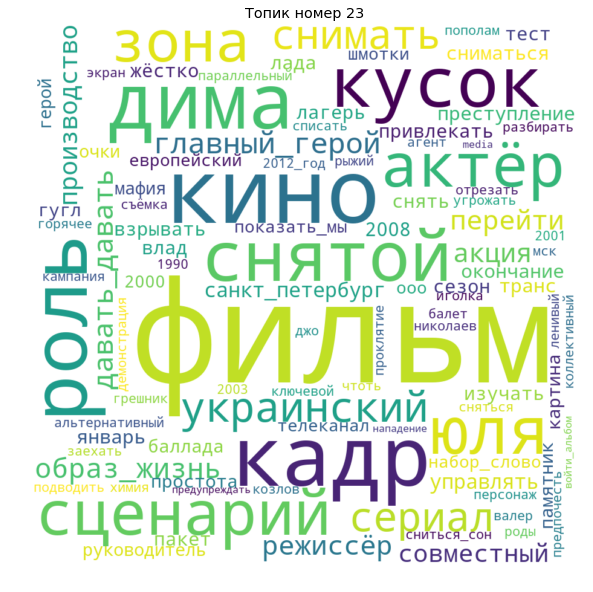

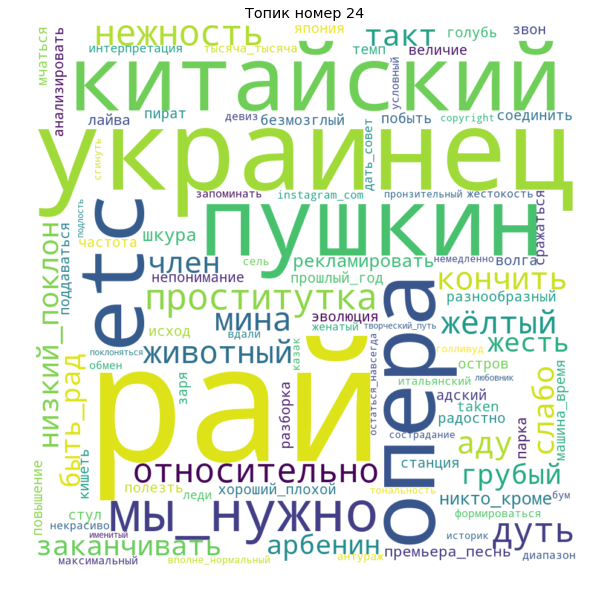

In [167]:
for i in range(20, 25):
    plotWordCloud(topic_number=i)

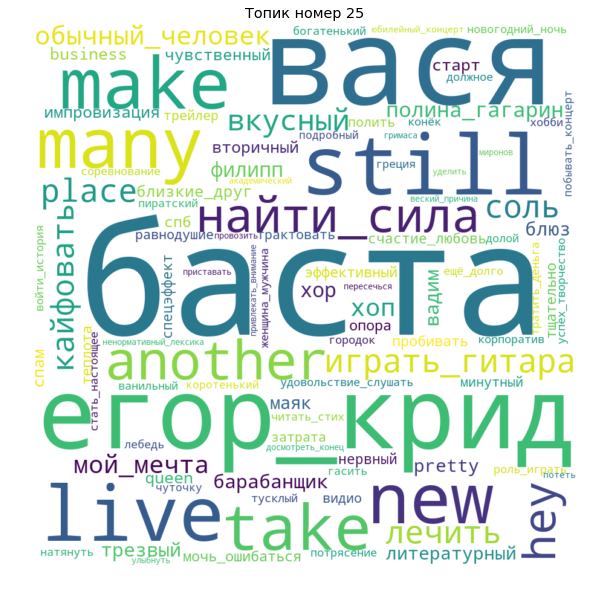

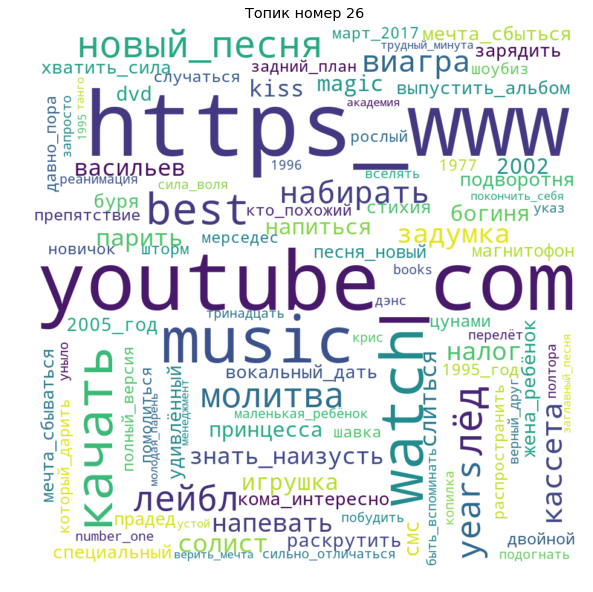

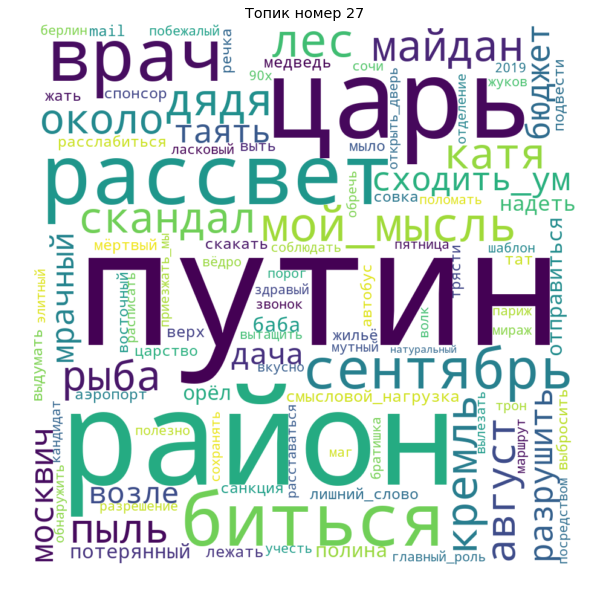

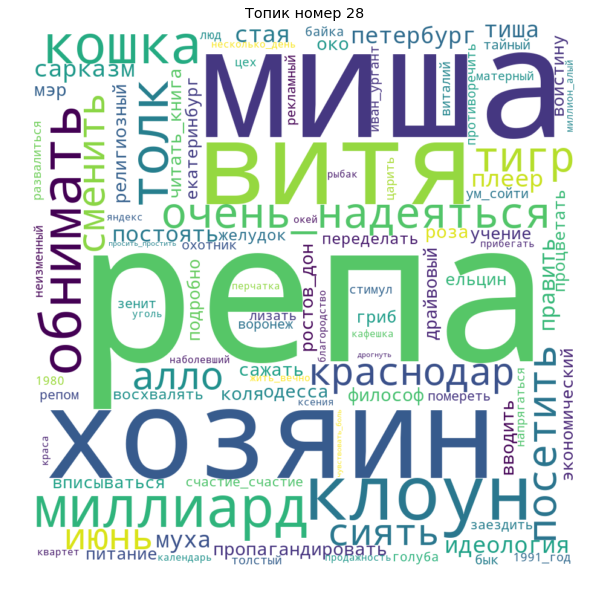

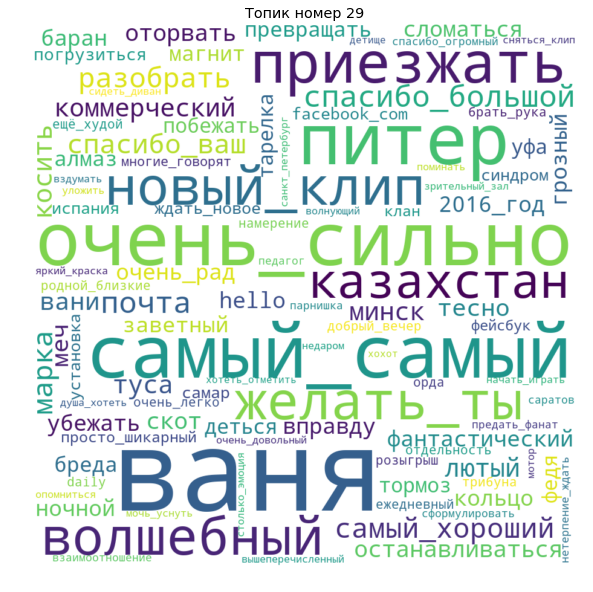

In [168]:
for i in range(25, 30):
    plotWordCloud(topic_number=i)

In [5]:
themes_30 = {
 0 : 'клипы на песни, видео',         1 : 'политика, Украина-Россия', 
 2 : 'общество и человек',            3 : 'рэп и говно',
 4 : 'социальные темы в рэпе',        5 : 'песни о любви',          
 6 : 'понравившиеся альбомы песен',   7 : 'человек, говорим, думаем и слушаем',
 8 : 'клубы и нюша',                  9 : 'тексты рок песен (АлисА)',       
 10: 'неинтерпретируемая',            11: 'веб-ссылки и старые песни',
 12: 'Тимати',                        13: 'песни о жизни и любви', 
 14: 'высокие темы: поэзия, творчество, книги',       15: 'Ария',
 16: 'новости и политика',                            17: 'тексты попсовых песен',           
 18: 'школа и её проблемы',                           19: 'покупка билетов на концерт',
 20: 'благодарности за концерт',                      21: 'денежные переводы',     
 22: 'глубоко обсуждаем музыку',                      23: 'фильмы и съемки кино',
 24: 'неинтерпретируемая',                            25: 'Баста и Егор Крид',   
 26: 'ссылки на YouTube',                             27: 'Путин, царь и политика',
 28: 'неинтерпретируемая',                            29: 'куча позитива и благодарностей' 
}

In [6]:
with open('lda_models/ldamodel_30_bigrams_long_comments', 'rb') as f:
    ldamodel_30 = pickle.load(f)

In [7]:
with open('lda_models/corpus', 'rb') as f:
    corpus = pickle.load(f)

In [8]:
expElogbeta = np.load("lda_models/ldamodel_30_bigrams_long_comments.expElogbeta.npy")
ldamodel_30.expElogbeta = expElogbeta

In [9]:
from tqdm import tqdm_notebook

In [10]:
def topicProfileGenre(model, music_style, dataset, corpus, genre=True):

    # Тут будем хранить результат
    theme_results = [ ]

    # Какое в модели количество топиков
    r = model.num_topics
    
    # Выбираем из таблицы те строки, которые соовтетствуют текущему жанру
    if genre:
        num = dataset[dataset.music_style == music_style].index.get_values() 
    else:
        num = dataset[dataset.performer == music_style].index.get_values() 

    # Вектор для тематического профиля жанра
    theme_profile = np.zeros(r)
    err = 0 # Для записи ошибок

    # Пробежимся по всем любителям текущего жанра
    for i in num:
        try:
            # вытаскиваем тематический профиль текущего юзера
            cur_user_prof = model.get_document_topics(corpus[i])

            # сортируем по номерам тем
            cur_user_prof = sorted(cur_user_prof, key=lambda w: w[0], reverse=True)      

            ind = [cup[0] for cup in cur_user_prof]     # делаем вектор с номерами тем
            prob = np.array([cup[1] for cup in cur_user_prof]) # делаем вектор с весами  
            theme_profile[ind] += prob        # Увеличиваем соответствующие веса
        except:
            err += 1 # Если возникла ошибка, значит профиль битый 

    # Нормируем к единице
    #print('Доля битых профилей для {}:'.format(music_style), err/len(num))
    theme_profile = theme_profile / np.sum(theme_profile)
    theme_profile = list(zip(range(30),theme_profile))
    return theme_profile

In [12]:
data_reduced = pd.read_csv("reduced_comments.csv")
data_reduced = data_reduced[data_reduced['comment_len']>40]
data_reduced.reset_index(inplace=True)

In [218]:
music_style_themes = { }
for music_style in tqdm_notebook(data_reduced.music_style.unique()):
    
    # Выделяем темы для текущего жанра
    theme = topicProfileGenre(ldamodel_30, music_style, data_reduced, corpus)
    
    # Записываем их в словарик:
    music_style_themes[music_style] = theme

Доля битых профилей для estrada: 0.0


Доля битых профилей для popsa: 0.0


Доля битых профилей для rock: 0.0


Доля битых профилей для metal: 0.0


Доля битых профилей для classic: 0.0


Доля битых профилей для rap: 0.0


Доля битых профилей для shanson: 0.0


Доля битых профилей для jazz: 0.0


Доля битых профилей для pank: 0.0


Доля битых профилей для dance: 0.0


Доля битых профилей для indi: 0.0


In [48]:
performer_themes = { }
for performer in tqdm_notebook(data_reduced.performer.unique()):
    
    # Выделяем темы для текущего жанра
    theme = topicProfileGenre(ldamodel_30, performer, data_reduced, corpus, genre=False)
    
    # Записываем их в словарик:
    performer_themes[performer] = theme

In [49]:
# Сохраняем словарик с тематическими профилями 
with open('performer_themes', 'wb') as f:
    pickle.dump(performer_themes, f)

In [219]:
# Сохраняем словарик с тематическими профилями 
with open('music_style_themes', 'wb') as f:
    pickle.dump(music_style_themes, f)

In [11]:
# Читаем словарик с тематическими профилями 
with open('music_style_themes', 'rb') as f:
    music_style_themes = pickle.load(f)
    
with open('performer_themes', 'rb') as f:
    performer_themes = pickle.load(f)

In [12]:
def profilePlot(theme_profile, music_style, themes=themes_30):
    """
    Строит тематическией профиль для каждого жанра
    theme_profile:
        тематический профиль, dict
    music_style: 
        стиль музыки
    themes dict:
        названия тем
    """
    
    theme_profile = theme_profile[music_style]
    sorted_prof = sorted(theme_profile, key=lambda w: w[1], reverse=True)   
    
    # рисуем картинку
    sns.set(font_scale=2)
    plt.subplots(figsize=(30, 40))
    
    prof = np.array([pr[1] for pr in sorted_prof]).reshape(1,30)
    them = [themes[pr[0]] for pr in sorted_prof]
    
    ax = plt.axes()    
    sns.heatmap(prof, ax = ax, square=True, annot=True, fmt=".2f", linewidths=0.1, 
                 cmap="YlGnBu", cbar=False, yticklabels='', xticklabels=them )
    ax.set_title('Тематический профиль для {}: \n'.format(music_style))
    plt.show()
    

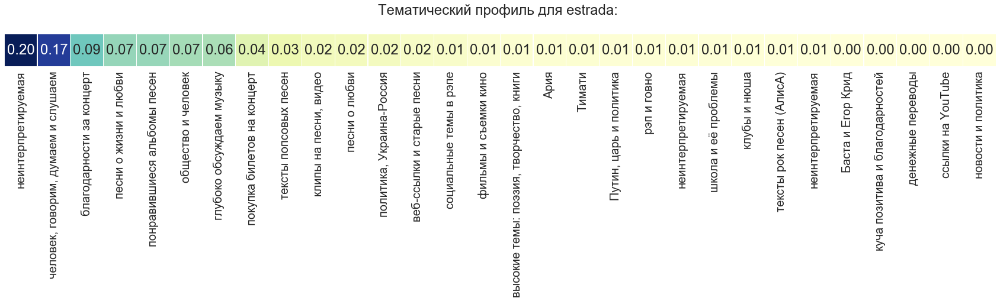

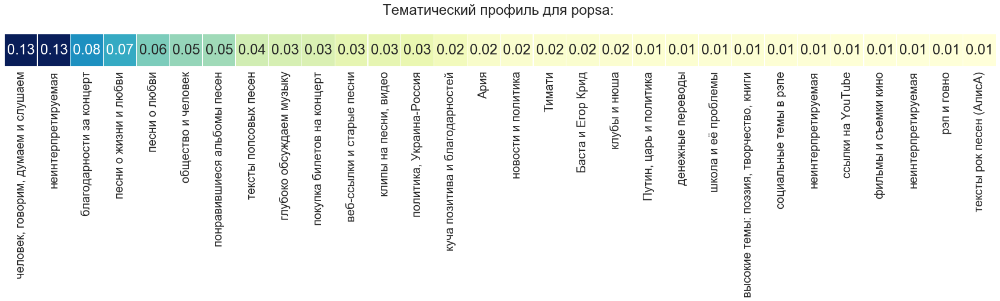

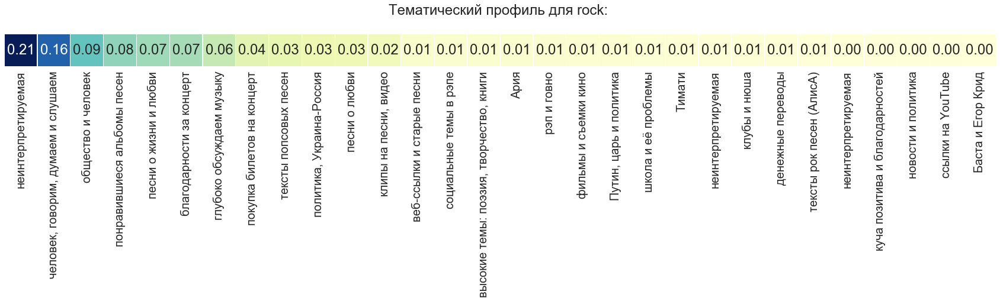

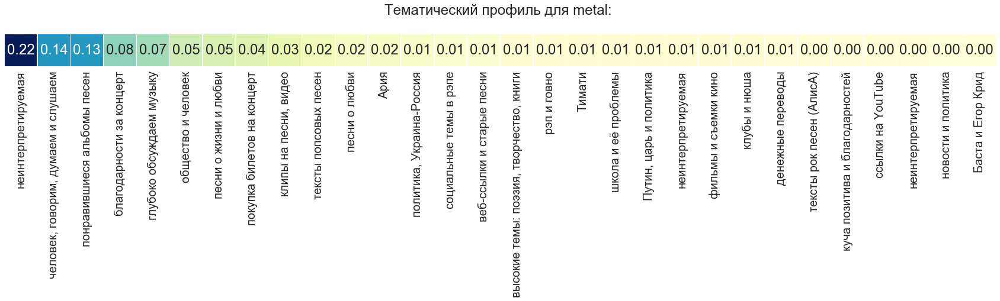

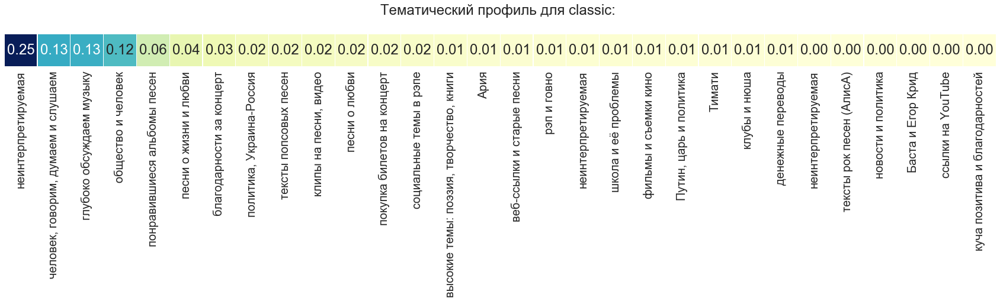

...

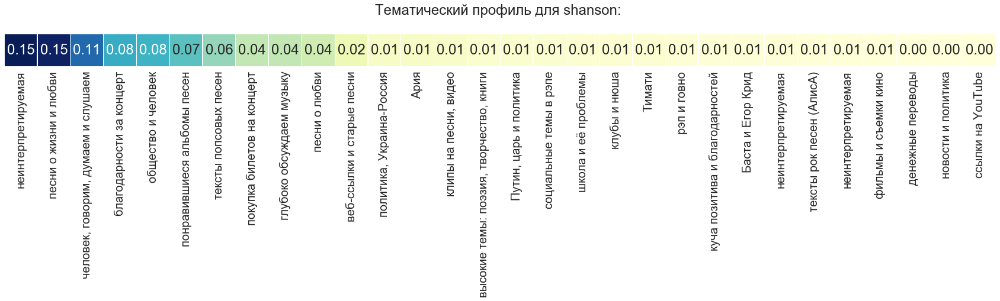

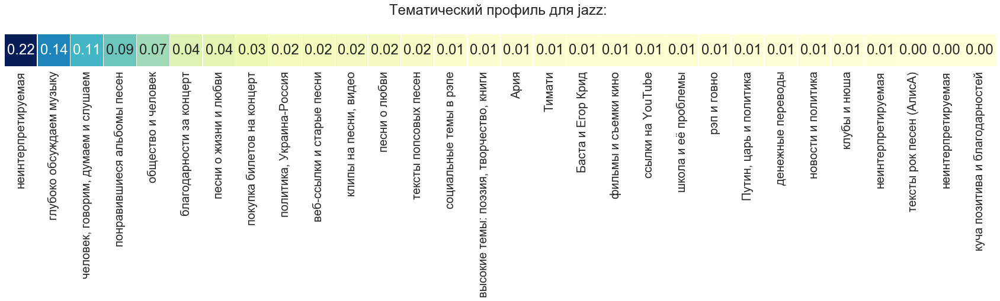

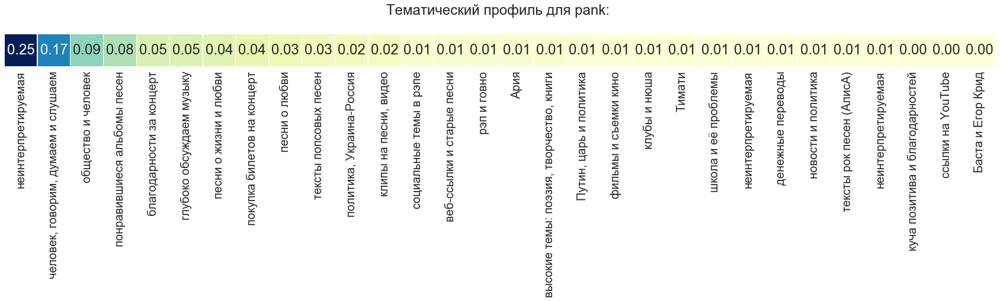

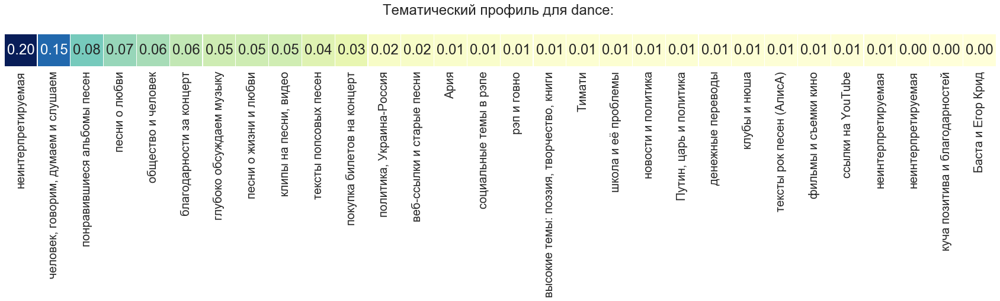

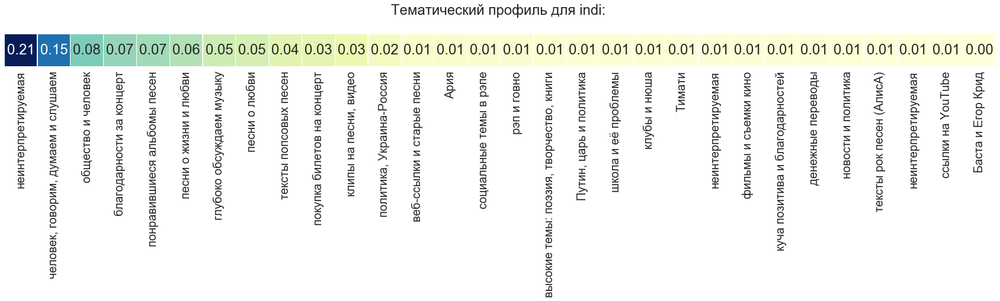

In [16]:
for music_style in data_reduced.music_style.unique():
    profilePlot(music_style_themes, music_style)

# Интерактив

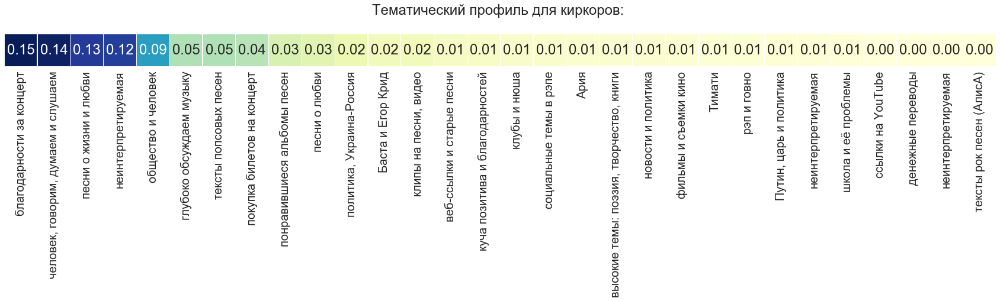

In [13]:
profilePlot(performer_themes, 'киркоров')

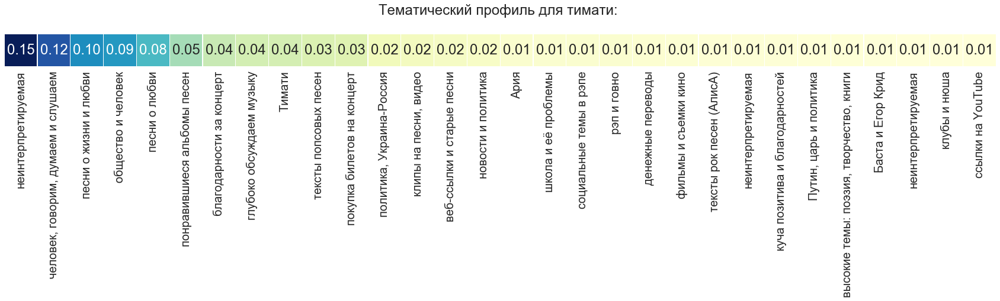

In [52]:
profilePlot(performer_themes, 'тимати')

## 5. Близость любителей разных жанров

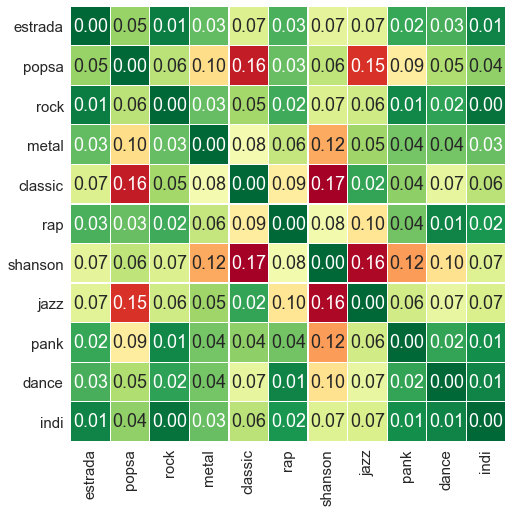

In [21]:
from scipy.spatial.distance import cosine
music_style = list(music_style_themes.keys())
n = len(music_style)  # выясняем число жанров
R = np.zeros((n,n))  # заводим матрицу расстояний 

for i in range(n):
    can_1 = [item[1] for item in music_style_themes[music_style[i]]]     # выделяем вектор для первого 
    for j in range(n):
        can_2 = [item[1] for item in music_style_themes[music_style[j]]] # выделяем второй вектор 
        R[i,j] = cosine(can_1, can_2) # ищем косинусное расстояние. Почему косинусное? 
                                      # Просто оно классное! 
            
            
sns.set(font_scale=1.5)
plt.subplots(figsize=(8, 8))
sns.heatmap(R, square=True,
            annot=True, fmt=".2f", linewidths=0.1, cmap="RdYlGn_r",
            yticklabels=music_style, xticklabels=music_style,cbar=False);

In [23]:
performers = list(performer_themes.keys())
n = len(performers)  # выясняем число исполнителей
R = np.zeros((n,n))  # заводим матрицу расстояний 

for i in range(n):
    can_1 = [item[1] for item in performer_themes[performers[i]]]     # выделяем вектор для первого 
    for j in range(n):
        can_2 = [item[1] for item in performer_themes[performers[j]]] # выделяем второй вектор 
        R[i,j] = cosine(can_1, can_2) # ищем косинусное расстояние

In [24]:
performers_distances = pd.DataFrame(R, columns=performers, index=performers)

In [25]:
performers_distances.head()

,лепс,пугачёва,михайлов,меладзе,ваенга,киркоров,валерия,агутин,газманов,басков,...,мальбэк,пошлая_молли,гш,казускома,краснознаменная_дивизия_имени_моей_бабушки,рыцарные_рыцари,пасош,motorama,pompeya,sonic_death
лепс,0.000000,0.102853,0.278253,0.060176,0.051533,0.041132,0.057835,0.019029,0.075695,0.132678,...,0.071529,0.072406,0.065885,0.228343,0.076995,0.379384,0.039770,0.166213,0.114193,0.173663
пугачёва,0.102853,0.000000,0.323272,0.021180,0.039536,0.161729,0.219271,0.116486,0.164536,0.377632,...,0.043631,0.055879,0.059028,0.134005,0.088309,0.473381,0.074442,0.101921,0.083950,0.058513
михайлов,0.278253,0.323272,0.000000,0.276216,0.319848,0.396523,0.483717,0.359454,0.448224,0.591067,...,0.348175,0.235038,0.237212,0.538230,0.455715,0.432263,0.361050,0.416306,0.281275,0.540756
меладзе,0.060176,0.021180,0.276216,0.000000,0.022445,0.123800,0.166646,0.069199,0.147581,0.303752,...,0.032416,0.033918,0.042469,0.189402,0.069131,0.446806,0.069221,0.132332,0.058632,0.097547
ваенга,0.051533,0.039536,0.319848,0.022445,0.000000,0.079815,0.125424,0.054911,0.109300,0.254680,...,0.062533,0.058114,0.045048,0.196325,0.077183,0.441921,0.053920,0.124353,0.108131,0.098165


In [49]:
def plotMostSimilarDifferent(performer, distances=performers_distances):
    
    slice_most_similar = performers_distances.nsmallest(
        11, [performer])[[performer]].iloc[1:]
    slice_most_different = performers_distances.nlargest(
        10, [performer])[[performer]].sort_values(by=performer)
    
    result = pd.concat([slice_most_similar, slice_most_different])
    
    plt.figure(figsize=(20, 30))
    ax = plt.axes() 
    sns.heatmap(result.values.reshape(1, 20), ax = ax, square=True, annot=True, fmt=".2f", linewidths=0.1, 
                     cmap="YlGnBu", cbar=False, yticklabels='', xticklabels=result.index)
    ax.set_title('{}: топ-10 похожих и непохожих\n'.format(performer).capitalize())
    plt.show()

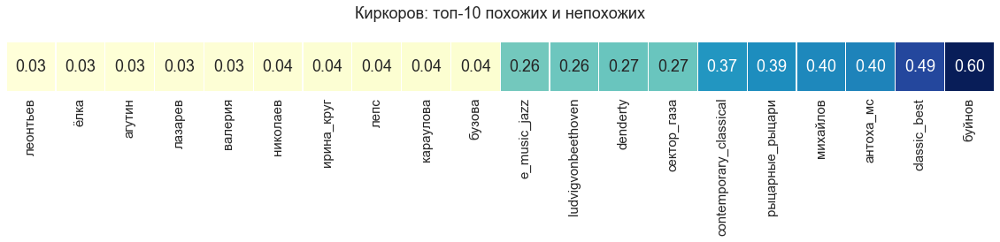

In [51]:
plotMostSimilarDifferent('киркоров')

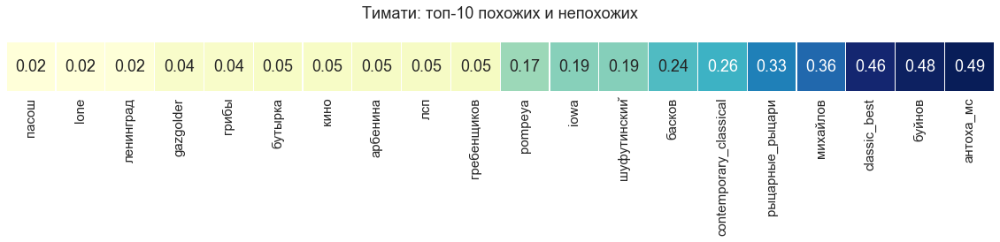

In [52]:
plotMostSimilarDifferent('тимати')

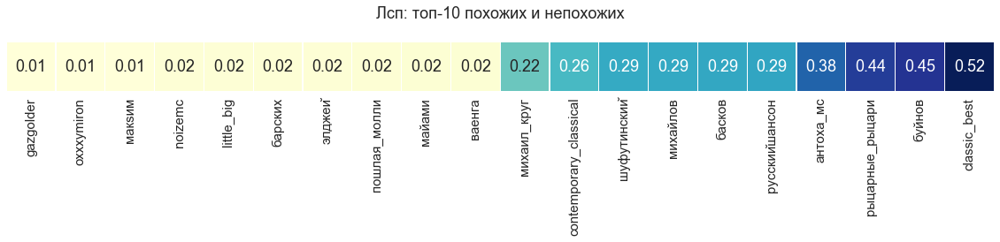

In [53]:
plotMostSimilarDifferent('лсп')

# Sentiment viz

In [3]:
path = '/Users/dmitrys/Yandex.Disk.localized/top_russian_music/comments/vk/'
print("Reading data")

with open(path + "vk_full_sentiments_1", 'rb') as f:
    comments = pickle.load(f)
with open(path + "vk_full_sentiments_2", 'rb') as f:
    comments.extend(pickle.load(f))
    
data = pd.DataFrame(comments)
del comments
print("Data shape:",data.shape)

Reading data
Data shape: (9297743, 15)


In [4]:
data.head()

,audio,author,comment_id,date,dirty_text,emoji,likes,link,music_style,performer,rusentiment_model,stickers,text,twitter_mokron_model,video
0,None,134973383,52228413_282387_282388,2018-12-31 21:40:35,"Шикарный подарок , песня замечательная !!!! Сп...",None,21,None,estrada,лепс,[speech],None,шикарный подарок песня замечательный спасибооо...,[Negative],None
1,None,197130573,52228413_282387_282390,2018-12-31 21:53:36,Самый лучший подарок - закончить год под песни...,None,15,None,estrada,лепс,[positive],None,самый хороший подарок закончить год песнь григ...,[Negative],None
2,None,34154783,52228413_282387_282399,2018-12-31 22:40:49,"Песни хит. Уверен, что получит много наград в ...",None,12,None,estrada,лепс,[neutral],None,песнь хит уверенный получить награда наступить...,[Positive],None
3,None,288989050,52228413_282387_282411,2018-12-31 23:53:59,С новым годом вас с новым счастьем вас. Пусть ...,None,0,None,estrada,лепс,[speech],None,новый год новый счастие пусть ваш самый заветн...,[Negative],None
4,None,137435081,52228413_282387_282420,2019-01-01 00:44:39,,None,0,None,estrada,лепс,[neutral],sticker_10297,,[Negative],None


# Идея - сентименты по жанрам, по исполнителям

In [5]:
data_sentiment = data[['music_style', 'performer', 'rusentiment_model', 'twitter_mokron_model']]
data_sentiment['rusentiment_model'] = data_sentiment['rusentiment_model'].apply(lambda x: x[0])
data_sentiment['twitter_mokron_model'] = data_sentiment['twitter_mokron_model'].apply(lambda x: x[0])
data_sentiment['count'] = 1

In [25]:
data_sentiment.head()

,music_style,performer,rusentiment_model,twitter_mokron_model,count
0,estrada,лепс,speech,Negative,1
1,estrada,лепс,positive,Negative,1
2,estrada,лепс,neutral,Positive,1
3,estrada,лепс,speech,Negative,1
4,estrada,лепс,neutral,Negative,1


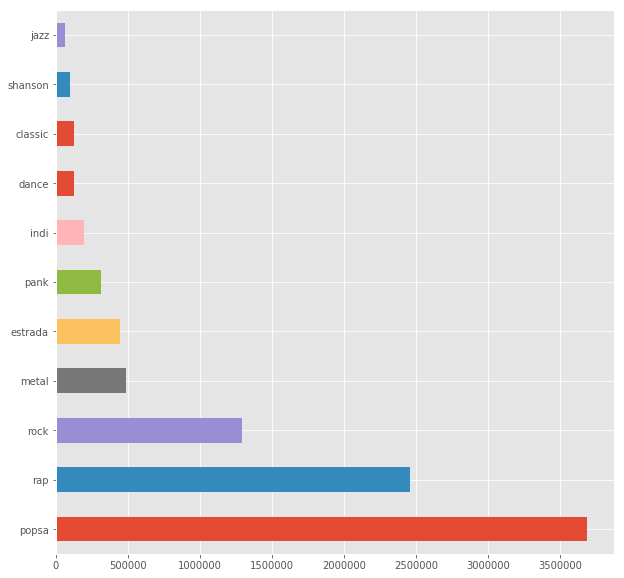

In [10]:
plt.figure(figsize=(10, 10))
data_sentiment.music_style.value_counts().plot.barh()
plt.show()

In [34]:
sentiment_style_grouped = data_sentiment.groupby("music_style").rusentiment_model.value_counts(normalize=True)
sentiment_style_grouped = sentiment_style_grouped.reset_index(name='percentage')
sentiment_style_grouped = sentiment_style_grouped.set_index('music_style')

In [49]:
sentiment_style_grouped.head()

,rusentiment_model,percentage
music_style,,
classic,neutral,0.718050
classic,positive,0.154481
classic,negative,0.063082
classic,speech,0.041314
classic,skip,0.023073


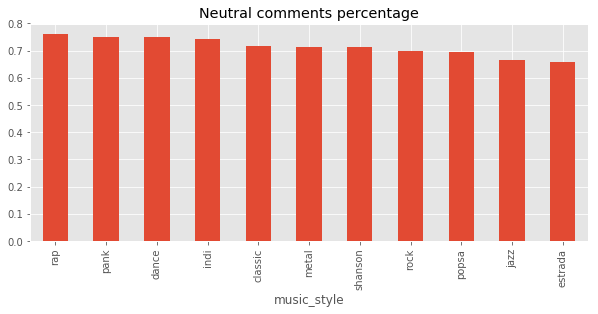

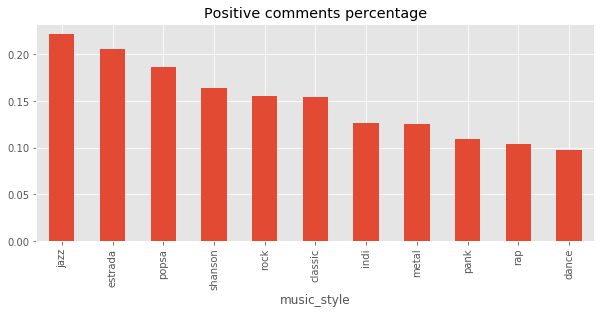

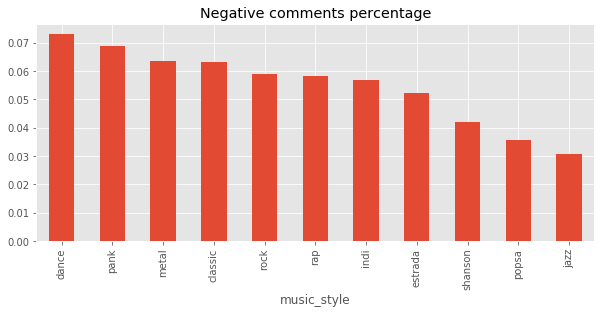

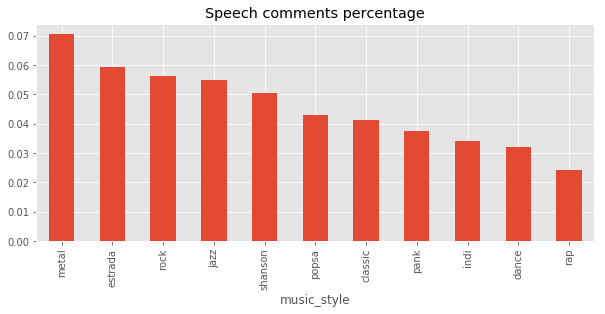

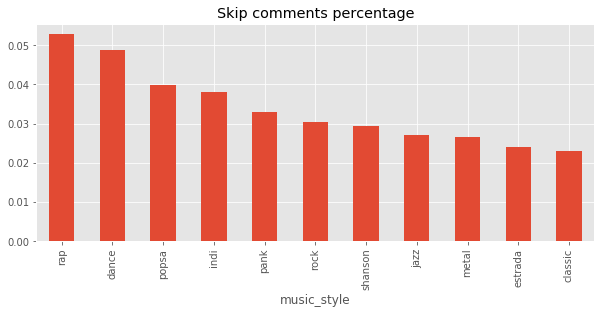

In [72]:
for sentiment in sentiment_style_grouped.rusentiment_model.unique():
    sentiment_style_grouped[
        sentiment_style_grouped.rusentiment_model==sentiment
    ].sort_values(
        by='percentage', ascending=False
    ).plot.bar(
        figsize=(10, 4), 
        legend=None,
        title='{} comments percentage'.format(sentiment).capitalize()
    );

In [73]:
sentiment_style_grouped = data_sentiment.groupby("music_style").twitter_mokron_model.value_counts(normalize=True)
sentiment_style_grouped = sentiment_style_grouped.reset_index(name='percentage')
sentiment_style_grouped = sentiment_style_grouped.set_index('music_style')
sentiment_style_grouped.head()

,twitter_mokron_model,percentage
music_style,,
classic,Negative,0.764094
classic,Positive,0.235906
dance,Negative,0.801878
dance,Positive,0.198122
estrada,Negative,0.703535


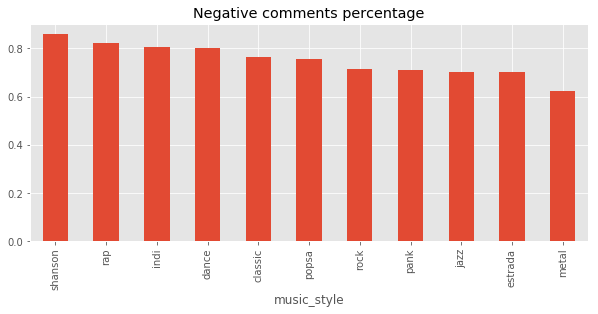

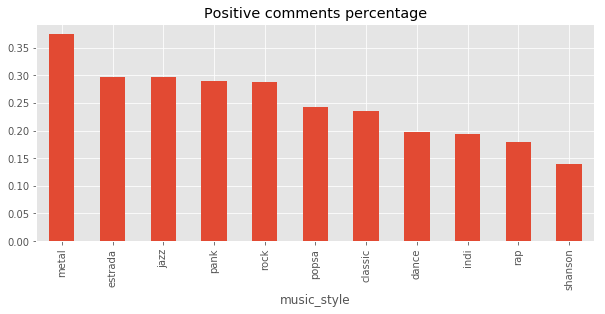

In [75]:
for sentiment in sentiment_style_grouped.twitter_mokron_model.unique():
    sentiment_style_grouped[
        sentiment_style_grouped.twitter_mokron_model==sentiment
    ].sort_values(
        by='percentage', ascending=False
    ).plot.bar(
        figsize=(10, 4), 
        legend=None,
        title='{} comments percentage'.format(sentiment).capitalize()
    );

In [76]:
data.head()

,audio,author,comment_id,date,dirty_text,emoji,likes,link,music_style,performer,rusentiment_model,stickers,text,twitter_mokron_model,video
0,None,134973383,52228413_282387_282388,2018-12-31 21:40:35,"Шикарный подарок , песня замечательная !!!! Сп...",None,21,None,estrada,лепс,[speech],None,шикарный подарок песня замечательный спасибооо...,[Negative],None
1,None,197130573,52228413_282387_282390,2018-12-31 21:53:36,Самый лучший подарок - закончить год под песни...,None,15,None,estrada,лепс,[positive],None,самый хороший подарок закончить год песнь григ...,[Negative],None
2,None,34154783,52228413_282387_282399,2018-12-31 22:40:49,"Песни хит. Уверен, что получит много наград в ...",None,12,None,estrada,лепс,[neutral],None,песнь хит уверенный получить награда наступить...,[Positive],None
3,None,288989050,52228413_282387_282411,2018-12-31 23:53:59,С новым годом вас с новым счастьем вас. Пусть ...,None,0,None,estrada,лепс,[speech],None,новый год новый счастие пусть ваш самый заветн...,[Negative],None
4,None,137435081,52228413_282387_282420,2019-01-01 00:44:39,,None,0,None,estrada,лепс,[neutral],sticker_10297,,[Negative],None


In [78]:
data['date'] = pd.to_datetime(data['date'])

In [148]:
data_sentiment = data[['date', 'music_style', 'performer', 'rusentiment_model', 'twitter_mokron_model']]
data_sentiment['rusentiment_model'] = data_sentiment['rusentiment_model'].apply(lambda x: x[0])
data_sentiment['twitter_mokron_model'] = data_sentiment['twitter_mokron_model'].apply(lambda x: x[0])

In [149]:
model = 'rusentiment_model'

data_sentiment['Negative'] = data_sentiment[model].str.lower() =='negative'
data_sentiment['Positive'] = data_sentiment[model].str.lower() =='positive'
data_sentiment['Neutral'] = (data_sentiment[model].str.lower() != 'negative') &\
                            (data_sentiment[model].str.lower() !='positive')


In [150]:
data_sentiment.head()

,date,music_style,performer,rusentiment_model,twitter_mokron_model,Negative,Positive,Neutral
0,2018-12-31 21:40:35,estrada,лепс,speech,Negative,False,False,True
1,2018-12-31 21:53:36,estrada,лепс,positive,Negative,False,True,False
2,2018-12-31 22:40:49,estrada,лепс,neutral,Positive,False,False,True
3,2018-12-31 23:53:59,estrada,лепс,speech,Negative,False,False,True
4,2019-01-01 00:44:39,estrada,лепс,neutral,Negative,False,False,True


In [155]:
def plotSentimentByGenre(music_style, data_sentiment=data_sentiment):
    data_sentiment_abs = data_sentiment[
        [
            'date', 
            'Positive', 
            #'Neutral',
            'Negative']
    ][
        (data_sentiment.music_style==music_style)
    ].groupby('date').sum()

    data_sentiment_abs = data_sentiment_abs.resample('W', how=sum)
    data_sentiment_perc = data_sentiment_abs.divide(data_sentiment_abs.sum(axis=1), axis=0)
    
    # строим красивую картинку 
    plt.figure(figsize=(14,3))

    # colors: https://www.color-hex.com/color/2ecc71
    pal = [
        "#e74c3c", 
        #"#f1c40f", 
        "#2ecc71"
    ]

    plt.stackplot(data_sentiment_perc.index,
                  data_sentiment_perc['Negative'], 
                  #data_sentiment_perc['Neutral'],
                  data_sentiment_perc['Positive'], 
                  labels=[
                      'Negative',
                      #'Neutral',
                      'Positive'],  colors=pal)

    plt.legend(loc='lower right')
    plt.margins(0,0)
    plt.title('Доли тональности ({})'.format(music_style),size=18)
    plt.show()

In [122]:
def plotSentimentByPerformer(performer, data_sentiment=data_sentiment):
    data_sentiment_abs = data_sentiment[
        ['date', 'Positive', 'Neutral','Negative']
    ][
        (data_sentiment.performer==performer)
    ].groupby('date').sum()

    data_sentiment_abs = data_sentiment_abs.resample('W', how=sum)
    data_sentiment_perc = data_sentiment_abs.divide(data_sentiment_abs.sum(axis=1), axis=0)
    
    # строим красивую картинку 
    plt.figure(figsize=(14,3))

    # colors: https://www.color-hex.com/color/2ecc71
    pal = [
        "#e74c3c", 
        #"#f1c40f", 
        "#2ecc71"
    ]

    plt.stackplot(data_sentiment_perc.index,
                  data_sentiment_perc['Negative'], 
                  #data_sentiment_perc['Neutral'],
                  data_sentiment_perc['Positive'], 
                  labels=[
                      'Negative',
                      #'Neutral',
                      'Positive'],  colors=pal)

    plt.legend(loc='lower right')
    plt.margins(0,0)
    plt.title('Доли тональности ({})'.format(performer),size=18)
    plt.show()

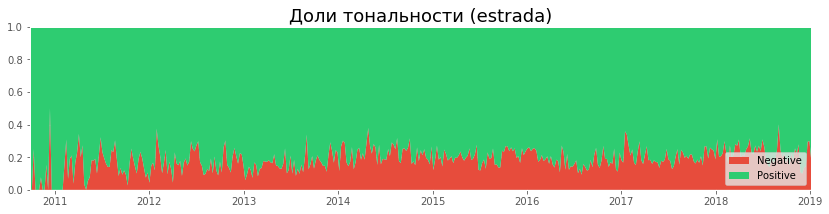

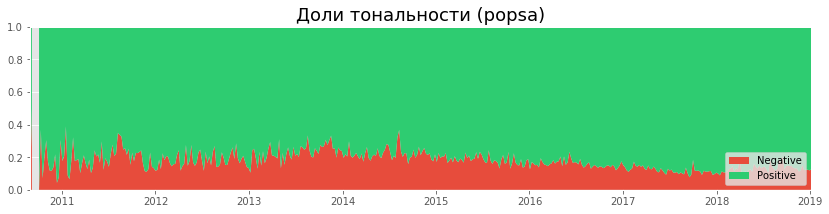

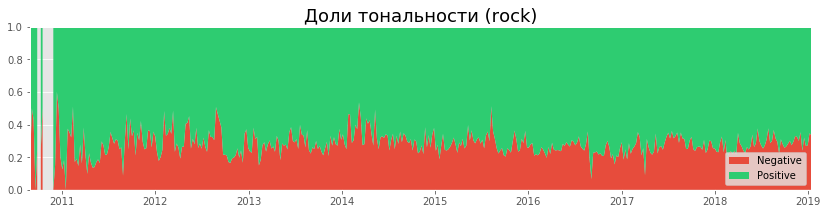

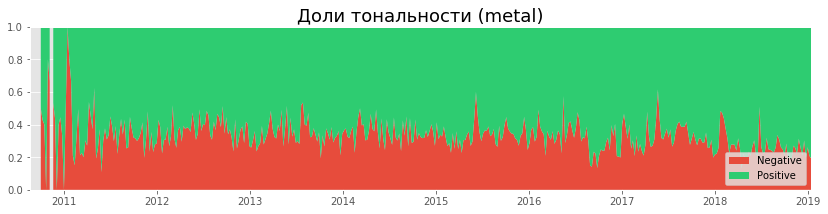

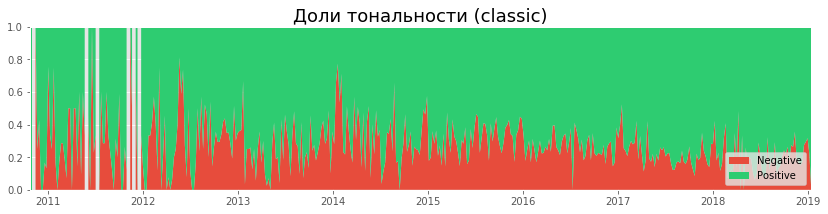

...

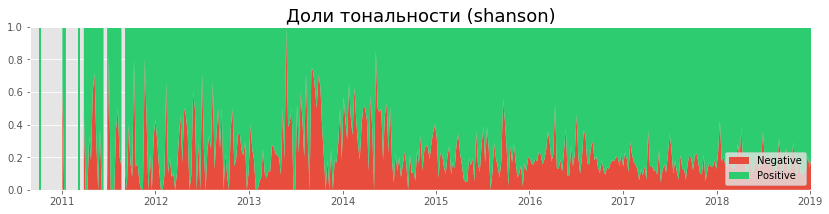

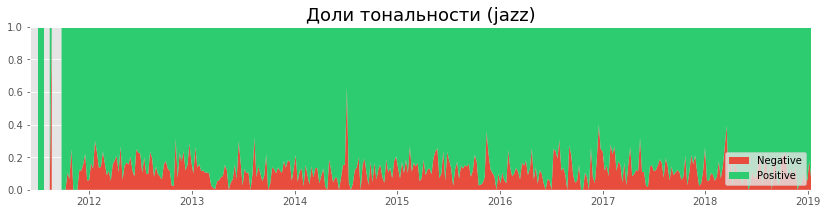

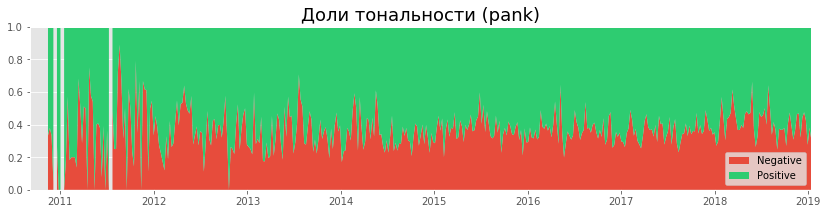

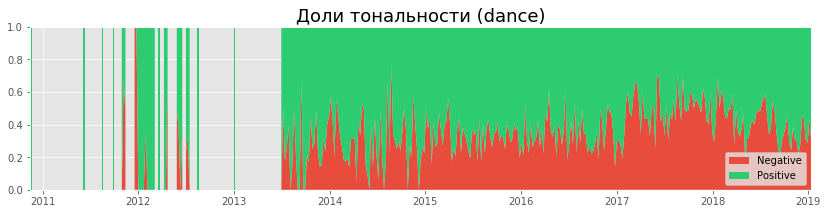

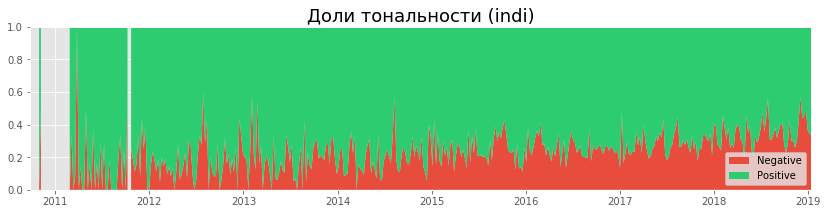

In [156]:
for music_style in data_sentiment.music_style.unique():
    plotSentimentByGenre(music_style)

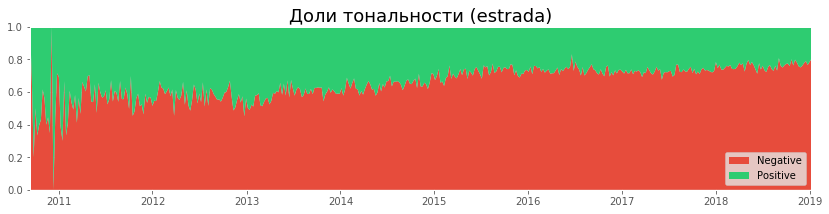

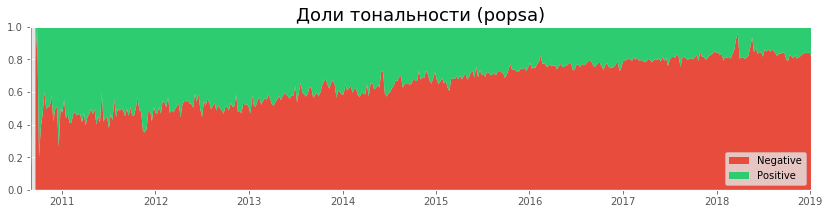

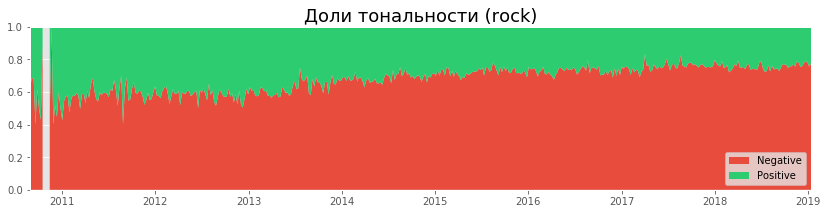

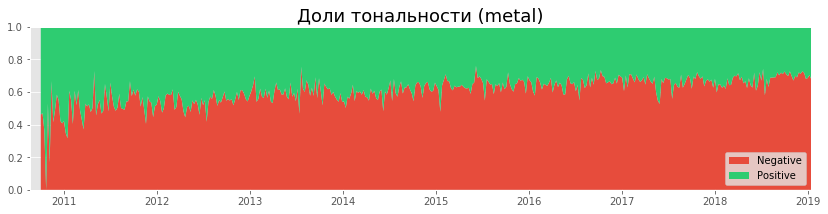

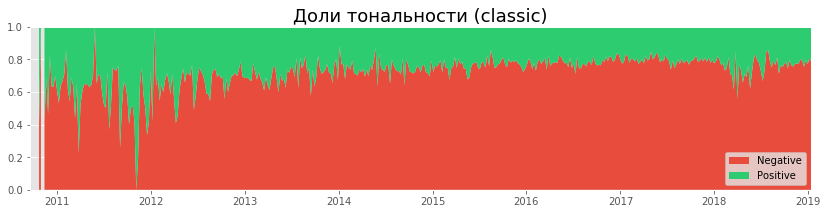

...

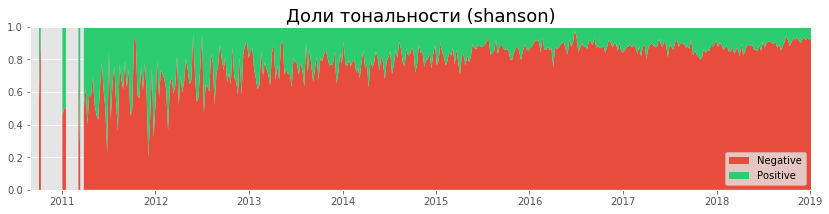

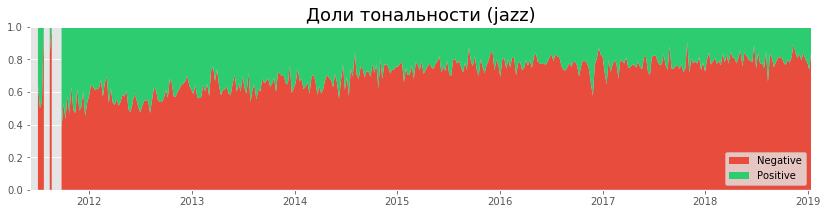

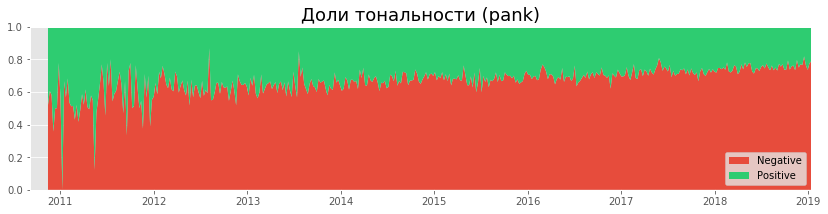

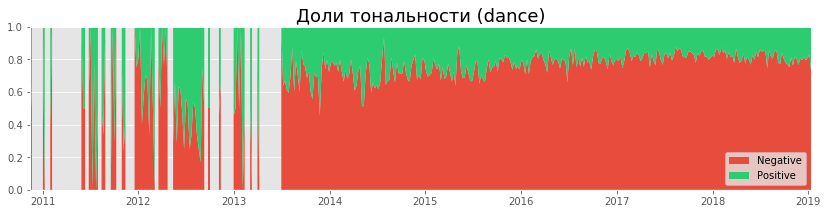

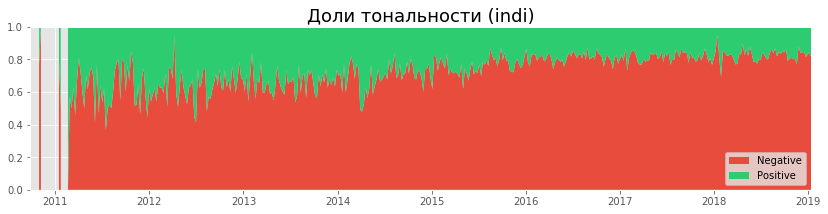

In [131]:
for music_style in data_sentiment.music_style.unique():
    plotSentimentByGenre(music_style)

In [133]:
data_sentiment.performer.unique()

array(['лепс', 'пугачёва', 'михайлов', 'меладзе', 'ваенга', 'киркоров',
       'валерия', 'агутин', 'газманов', 'басков', 'николаев', 'ротару',
       'лолита', 'леонтьев', 'буйнов', 'бузова', 'тимати', 'нюша',
       'loboda', 'билан', 'крид', '2маши', 'барских', 'гагарина',
       'темникова', 'serebro', 'лазарев', 'ёлка', 'руки_вверх', 'макsим',
       'градусы', 'виа_гра', "a'studio", 'iowa', 'караулова', 'кока',
       'майами', 'беляев', 'би_2', 'ленинград', 'кино', 'сплин',
       'мумий_тролль', 'звери', 'гребенщиков', 'земфира', 'ддт',
       'кукрыниксы', 'арбенина', 'чичерина', 'несчастный_случай',
       'смысловые_галлюцинации', 'ногу_свело', 'король_и_шут',
       'агата_кристи', 'ария', 'louna', 'кипелов', 'stigmata',
       'коррозия_метала', 'чёрный_обелиск', 'маврин', 'эпидемия',
       'classic_best', 'classical_music_guide', 'classicstories',
       'classikmusik', 'contemporary_classical', 'inclassic',
       'ludvigvonbeethoven', 'petertchaikovsky', 'pi_a_no', 'wm

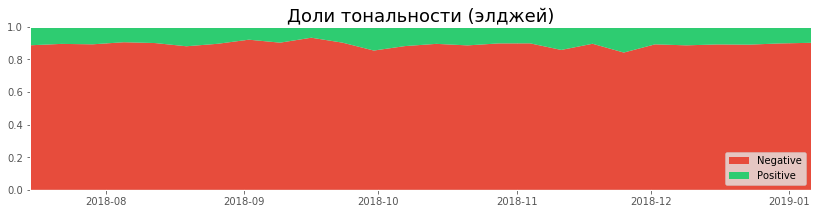

In [147]:
plotSentimentByPerformer("элджей")

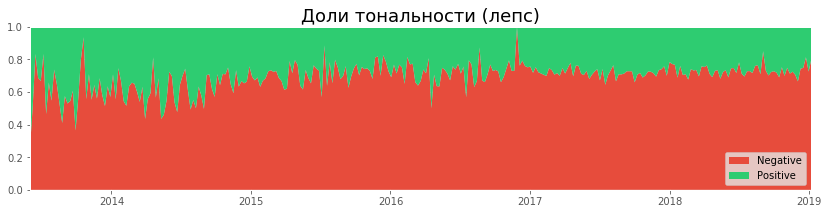

In [123]:
for music_style in data_sentiment.performer.unique():
    plotSentimentByPerformer(performer)

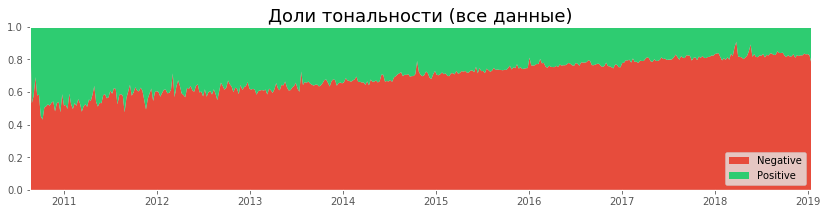

In [128]:
data_sentiment_abs = data_sentiment[
    ['date', 'Positive', 'Neutral','Negative']
].groupby('date').sum()

data_sentiment_abs = data_sentiment_abs.resample('W', how=sum)
data_sentiment_perc = data_sentiment_abs.divide(data_sentiment_abs.sum(axis=1), axis=0)

# строим красивую картинку 
plt.figure(figsize=(14,3))

# colors: https://www.color-hex.com/color/2ecc71
pal = [
    "#e74c3c", 
    #"#f1c40f", 
    "#2ecc71"
]

plt.stackplot(data_sentiment_perc.index,
              data_sentiment_perc['Negative'], 
              #data_sentiment_perc['Neutral'],
              data_sentiment_perc['Positive'], 
              labels=[
                  'Negative',
                  #'Neutral',
                  'Positive'],  colors=pal)

plt.legend(loc='lower right')
plt.margins(0,0)
plt.title('Доли тональности (все данные)',size=18)
plt.show()